In [21]:
import numpy as np
import torch
import qelos as q
import plotly.express as px
import json
from tabulate import tabulate
import pandas as pd
import seaborn
from matplotlib import pyplot as plt

In [2]:
# check lengths
def check_lengths(id, ood):
    def _check_lengths(d, which):
        inplens = []
        goldlens = []
        predlens = []
        for i, x in enumerate(d):
            inplens.append(len(x["input"]))
            goldlens.append(len(x["gold"]))
            if len(x["pred"]) < 50 or True:
                predlens.append(len(x["pred"]))
        print(f"{which} lengths")
        print(f"Input length: max: {max(inplens)}, avg: {np.mean(inplens):.1f}")
        print(f"Gold length: max: {max(goldlens)}, avg: {np.mean(goldlens):.1f}")
        print(f"Predicted length: max: {max(predlens)}, avg: {np.mean(predlens):.1f}")
        print()
        return predlens
    idlens = _check_lengths(id, "ID")
    oodlens = _check_lengths(ood, "OOD")
    return idlens, oodlens

In [3]:
def print_pretty(d, which, firstk=-1, printfirstk=-1):
    # print pretty
    cnt = 0
    metrics = []       
    for i, x in enumerate(d):
        if printfirstk > 0 and cnt+1 <= printfirstk:
            print(f"{which} Example {i+1}:" + "".join(["="]*25))
            print(f"Input: (length {len(x['input'])}) " + " ".join(x["input"]))
            print(f"Gold: (length {len(x['gold'])}) " + " ".join(x["gold"]))
            print(f"Prediction: (length {len(x['pred'])})")
        bestprobs = x["bestprobs"] if "bestprobs" in x else x["bestnlls"]
        entropies = x["entropies"]
        nlls = -np.log(np.asarray(bestprobs))
        xm = {"avgprob": sum(bestprobs)/len(bestprobs), "maxprob": max(bestprobs), "minprob": min(bestprobs),
              "avgent": sum(entropies)/len(entropies), "maxent": max(entropies), "minent": min(entropies),
              "sumnll": sum(nlls), "avgnll": sum(nlls)/len(nlls)}
        metrics.append(xm)
        if printfirstk > 0 and cnt+1 <= printfirstk:
            print(f"Best probs: avg={xm['avgprob']:.5f}, max={xm['maxprob']:.5f}, min={xm['minprob']:.5f}")
            print(f"Entropies: avg={xm['avgent']:.5f}, max={xm['maxent']:.5f}, min={xm['minent']:.5f}")
            print(f"SumNLL: {xm['sumnll']:.5f}, AvgNLL: {xm['avgnll']:.5f}")
            print(tabulate([x["pred"], [f"{xe:.5f}" for xe in entropies], [f"{xe:.5f}" for xe in bestprobs]]))
            print()
        
        if firstk > 0 and cnt+1 >= firstk:
            break
        cnt += 1
    return metrics

In [62]:
name = "compood_gru_baseline_v3.v4.driven-fog-268.outputs.json"
name = "compood_gru_baseline_v3.v4.worldly-disco-269.outputs.json"
name = "compood_baseline_v3.v4.copper-energy-190.outputs.json"      # learned absolute positioning

# name = "compood_baseline_v3.v4.earnest-meadow-221.outputs.json"      # learned absolute positioning latest #1 on LENGTH
# name = "compood_baseline_v3.v4.absurd-night-220.outputs.json"      # learned absolute positioning latest #2 on LENGTH
# name = "compood_baseline_v3.v4.decent-valley-218.outputs.json"      # learned absolute positioning latest #3 on LENGTH

name = "compood_baseline_v3.v4.genial-wave-223.outputs.json"      # relative positioning latest #1 on LENGTH
# name = "compood_baseline_v3.v4.tough-oath-222.outputs.json"      # relative positioning latest #1 on LENGTH
# name = "compood_baseline_v3.v4.rare-breeze-219.outputs.json"      # relative positioning latest #1 on LENGTH

# name = "compood_gru_baseline_v3.v4.misty-dragon-279.outputs.json"  # GRU on LENGTH
# name = "compood_gru_baseline_v3.v4.faithful-yogurt-278.outputs.json"  # GRU on LENGTH
# name = "compood_gru_baseline_v3.v4.fluent-water-277.outputs.json"  # GRU on LENGTH
# name = "compood_gru_baseline_v3.v4.easy-river-276.outputs.json"  # GRU on LENGTH
# name = "compood_gru_baseline_v3.v4.drawn-night-275.outputs.json"  # GRU on LENGTH

# name = "compood_baseline_v3.v4.stoic-sponge-196.outputs.json"      # sinusoid positioning in decoder
# name = "compood_baseline_v3.v4.mild-sponge-200.outputs.json"         # relative positions on LENGTH
# name = "compood_baseline_v3.v4.genial-wave-223.outputs.json"         # relative positions (with dropout) on LENGTH
# name = "compood_baseline_v3.v4.tough-oath-222.outputs.json"          # same
# name = "compood_baseline_v3.v4.jolly-fire-210.outputs.json"          # relative positions on JUMP
# name = "compood_baseline_v3.v4.rosy-deluge-208.outputs.json"          # absolute positions on JUMP

In [63]:
# loading
with open(name) as f:
    d = json.load(f)
    
id, ood = d["id"], d["ood"]

In [64]:
idlens, oodlens = check_lengths(id, ood)

ID lengths
Input length: max: 11, avg: 9.0
Gold length: max: 24, avg: 12.8
Predicted length: max: 25, avg: 13.8

OOD lengths
Input length: max: 11, avg: 10.2
Gold length: max: 50, avg: 31.6
Predicted length: max: 50, avg: 25.0



[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 34, 35, 50]


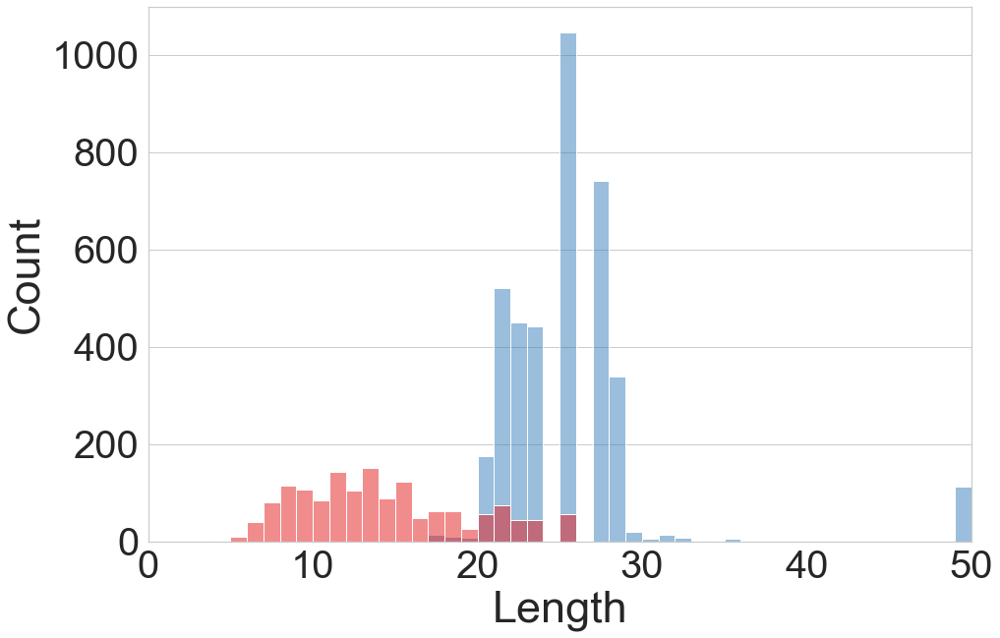

In [65]:
data = []
uniquelens = set()
for x in idlens:
    data.append([x, "id"])
for x in oodlens:
    data.append([x, "ood"])
    uniquelens.add(x)
df = pd.DataFrame(data, columns=["length", "idorood"])
fig = px.histogram(df, x="length", color="idorood", barmode="overlay")
fig.update_layout(font_size=18, paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)')
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='#dddddd')
fig.update_xaxes(range=[4, 50])
fig.show()
# fig.write_image(name + "_len_hist.pdf")
print(sorted(list(uniquelens)))

seaborn.set(rc={'figure.figsize':(15,10)})
seaborn.set_style("whitegrid")
seaborn.color_palette("bright")

ax = seaborn.histplot(data=df, x="length", hue="idorood", binwidth=1, palette="Set1")

ax.set_xlabel("Length",fontsize=45)
ax.set_ylabel("Count",fontsize=45)
ax.set(xlim=(0, 50))
ax.tick_params(labelsize=40)
ax.xaxis.grid()
plt.legend([],[], frameon=False)
plt.savefig(name + "_len_hist.sns.pdf")
plt.show()


In [66]:
print(set(oodlens))

{32, 34, 35, 15, 16, 17, 50, 18, 20, 21, 22, 23, 19, 25, 24, 27, 28, 29, 30, 31}


In [9]:
id_metrics = print_pretty(id, "ID", printfirstk=100)

ID Example 1:=========================
Input: (length 8) @START@ walk left and look left twice @END@
Gold: (length 8) (@R@ I_TURN_LEFT I_WALK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK )
Prediction: (length 9)
Best probs: avg=0.99999, max=1.00000, min=0.99998
Entropies: avg=0.00008, max=0.00023, min=0.00001
SumNLL: 0.00005, AvgNLL: 0.00001
-------  -----------  -------  -----------  -------  -----------  -------  -------  -----
(@R@     I_TURN_LEFT  I_WALK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   )        @END@
0.00001  0.00004      0.00004  0.00011      0.00006  0.00023      0.00005  0.00014
1.00000  1.00000      1.00000  0.99999      1.00000  0.99998      1.00000  0.99999
-------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 2:=========================
Input: (length 8) @START@ turn opposite left and jump thrice @END@
Gold: (length 7) (@R@ I_TURN_LEFT I_TURN_LEFT I_JUMP I_JUMP I_JUMP )
Prediction: (length 8)
Best probs: avg=0.99987, max

-------  -------  -------  -------  -------  -------  -----

ID Example 9:=========================
Input: (length 8) @START@ walk left after turn right thrice @END@
Gold: (length 7) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT I_TURN_LEFT I_WALK )
Prediction: (length 8)
Best probs: avg=0.99998, max=1.00000, min=0.99992
Entropies: avg=0.00021, max=0.00094, min=0.00001
SumNLL: 0.00011, AvgNLL: 0.00002
-------  ------------  ------------  ------------  -----------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_TURN_RIGHT  I_TURN_RIGHT  I_TURN_LEFT  I_WALK   )        @END@
0.00001  0.00004       0.00094       0.00010       0.00014      0.00013  0.00008
1.00000  1.00000       0.99992       0.99999       0.99999      0.99999  0.99999
-------  ------------  ------------  ------------  -----------  -------  -------  -----

ID Example 10:=========================
Input: (length 10) @START@ look opposite right and jump around left twice @END@
Gold: (length 21) (@R@ I_TURN_RIGHT I_TURN_RIGHT I

-------  ------------  ------------  ------------  ------------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------  -----

ID Example 17:=========================
Input: (length 8) @START@ jump left and walk left twice @END@
Gold: (length 8) (@R@ I_TURN_LEFT I_JUMP I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK )
Prediction: (length 9)
Best probs: avg=1.00000, max=1.00000, min=0.99999
Entropies: avg=0.00007, max=0.00013, min=0.00001
SumNLL: 0.00004, AvgNLL: 0.00000
-------  -----------  -------  -----------  -------  -----------  -------  -------  -----
(@R@     I_TURN_LEFT  I_JUMP   I_TURN_LEFT  I_WALK   I_TURN_LEFT  I_WALK   )        @END@
0.00001  0.00004      0.00003  0.00013      0.00006  0.00012      0.00007  0.00012
1.00000  1.00000      1.00000  0.99999      1.00000  0.99999      1.00000  0.99999
-------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 18:=========================
Input: (leng

-------  -----------  -----------  -----------  -----------  -----------  -----------  -------  -------  -----

ID Example 25:=========================
Input: (length 8) @START@ run thrice after look right twice @END@
Gold: (length 9) (@R@ I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_RUN I_RUN I_RUN )
Prediction: (length 10)
Best probs: avg=0.99999, max=1.00000, min=0.99996
Entropies: avg=0.00016, max=0.00047, min=0.00002
SumNLL: 0.00011, AvgNLL: 0.00001
-------  ------------  -------  ------------  -------  -------  -------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_LOOK   I_TURN_RIGHT  I_LOOK   I_RUN    I_RUN    I_RUN    )        @END@
0.00002  0.00004       0.00008  0.00004       0.00004  0.00028  0.00011  0.00047  0.00033
1.00000  1.00000       0.99999  1.00000       1.00000  0.99998  0.99999  0.99996  0.99997
-------  ------------  -------  ------------  -------  -------  -------  -------  -------  -----

ID Example 26:=========================
Input: (length 10) @START@ look 

-------  -----------  -----------  -------  -----------  -----------  -------  -----------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 32:=========================
Input: (length 10) @START@ walk right twice after turn opposite left thrice @END@
Gold: (length 12) (@R@ I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK )
Prediction: (length 13)
Best probs: avg=0.99998, max=1.00000, min=0.99984
Entropies: avg=0.00025, max=0.00169, min=0.00001
SumNLL: 0.00025, AvgNLL: 0.00002
-------  -----------  -----------  -----------  -----------  -----------  -----------  ------------  -------  ------------  -------  -------  -----
(@R@     I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   )        @END@
0.00001  0.00003      0.00010      0.00169      0.00007      0.00005   

-------  -----------  -----------  -------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -------  -----

ID Example 47:=========================
Input: (length 11) @START@ run opposite right thrice and run opposite left twice @END@
Gold: (length 17) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_RUN I_TURN_RIGHT I_TURN_RIGHT I_RUN I_TURN_RIGHT I_TURN_RIGHT I_RUN I_TURN_LEFT I_TURN_LEFT I_RUN I_TURN_LEFT I_TURN_LEFT I_RUN )
Prediction: (length 18)
Best probs: avg=0.99999, max=1.00000, min=0.99996
Entropies: avg=0.00011, max=0.00043, min=0.00003
SumNLL: 0.00013, AvgNLL: 0.00001
-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -----------  -----------  -------  -----------  -----------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_TURN_RIGHT  I_RUN    I_TURN_LEFT  I_TURN_LEFT  I_RUN    I_TUR

-------  -----------  -----------  -------  -----------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 54:=========================
Input: (length 8) @START@ run right and turn opposite left @END@
Gold: (length 6) (@R@ I_TURN_RIGHT I_RUN I_TURN_LEFT I_TURN_LEFT )
Prediction: (length 7)
Best probs: avg=0.99999, max=1.00000, min=0.99999
Entropies: avg=0.00009, max=0.00019, min=0.00001
SumNLL: 0.00004, AvgNLL: 0.00001
-------  ------------  -------  -----------  -----------  -------  -----
(@R@     I_TURN_RIGHT  I_RUN    I_TURN_LEFT  I_TURN_LEFT  )        @END@
0.00001  0.00004       0.00003  0.00009      0.00019      0.00016
1.00000  1.00000       1.00000  0.99999      0.99999      0.99999
-------  ------------  -------  -----------  -----------  -------  -----

ID Example 55:=========================
Input: (length 9) @START@ look right twice after jump left twice @END@
Gold: (length 10) (@R@ I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_RIG

Gold: (length 11) (@R@ I_TURN_LEFT I_TURN_LEFT I_WALK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK )
Prediction: (length 12)
Best probs: avg=0.99999, max=1.00000, min=0.99998
Entropies: avg=0.00010, max=0.00032, min=0.00002
SumNLL: 0.00008, AvgNLL: 0.00001
-------  -----------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----
(@R@     I_TURN_LEFT  I_TURN_LEFT  I_WALK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   )        @END@
0.00002  0.00004      0.00032      0.00014  0.00019      0.00009  0.00006      0.00006  0.00004      0.00004  0.00007
1.00000  1.00000      0.99998      0.99999  0.99999      0.99999  1.00000      1.00000  1.00000      1.00000  1.00000
-------  -----------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 68:=========================
Input: (length 9) @START@ jump right twice after run opposite left @END@
Gold: 

Input: (length 10) @START@ walk opposite right and walk opposite right twice @END@
Gold: (length 11) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_WALK I_TURN_RIGHT I_TURN_RIGHT I_WALK I_TURN_RIGHT I_TURN_RIGHT I_WALK )
Prediction: (length 12)
Best probs: avg=0.99995, max=1.00000, min=0.99946
Entropies: avg=0.00048, max=0.00462, min=0.00001
SumNLL: 0.00058, AvgNLL: 0.00005
-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_TURN_RIGHT  I_WALK   )        @END@
0.00001  0.00003       0.00013       0.00010  0.00003       0.00004       0.00010  0.00004       0.00013       0.00007  0.00462
1.00000  1.00000       0.99999       0.99999  1.00000       1.00000       0.99999  1.00000       0.99999       1.00000  0.99946
-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  

-------  ------------  ------------  -----------  -------  -------  -----

ID Example 89:=========================
Input: (length 8) @START@ look and walk around right twice @END@
Gold: (length 19) (@R@ I_LOOK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK )
Prediction: (length 20)
Best probs: avg=0.99999, max=1.00000, min=0.99995
Entropies: avg=0.00013, max=0.00057, min=0.00004
SumNLL: 0.00019, AvgNLL: 0.00001
-------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------  -----
(@R@     I_LOOK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   )        @END@
0.00009  0.00021  0.00004       0.0005

In [10]:
ood_metrics = print_pretty(ood, "OOD", printfirstk=100)

OOD Example 1:=========================
Input: (length 11) @START@ turn opposite right twice after look around left thrice @END@
Gold: (length 30) (@R@ I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT )
Prediction: (length 23)
Best probs: avg=0.99997, max=1.00000, min=0.99965
Entropies: avg=0.00029, max=0.00318, min=0.00001
SumNLL: 0.00059, AvgNLL: 0.00003
-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  ------------  ------------  ------------  -------  -----
(@R@     I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  

-------  ------------  ------------  ------------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 10:=========================
Input: (length 10) @START@ walk left twice after look around right thrice @END@
Gold: (length 30) (@R@ I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK )
Prediction: (length 23)
Best probs: avg=0.99998, max=1.00000, min=0.99983
Entropies: avg=0.00025, max=0.00182, min=0.00002
SumNLL: 0.00046, AvgNLL: 0.00002
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -------  -------  -----

OOD Example 19:=========================
Input: (length 11) @START@ look opposite right twice and run around right thrice @END@
Gold: (length 32) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN )
Prediction: (length 25)
Best probs: avg=0.99519, max=1.00000, min=0.88467
Entropies: avg=0.01509, max=0.35918, min=0.00003
SumNLL: 0.12276, AvgNLL: 0.00511
-------  ------------  ------------  -------  ------------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ---

-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 24:=========================
Input: (length 10) @START@ look around left twice and look around left @END@
Gold: (length 26) (@R@ I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK )
Prediction: (length 23)
Best probs: avg=0.99999, max=1.00000, min=0.99996
Entropies: avg=0.00011, max=0.00052, min=0.00004
SumNLL: 0.00018, AvgNLL: 0.00001
-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  

-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 29:=========================
Input: (length 10) @START@ walk around left twice after look around right @END@
Gold: (length 26) (@R@ I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK )
Prediction: (length 23)
Best probs: avg=0.99994, max=1.00000, min=0.99950
Entropies: avg=0.00060, max=0.00434, min=0.00003
SumNLL: 0.00131, AvgNLL: 0.00006
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  --

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 34:=========================
Input: (length 11) @START@ jump opposite right twice and look around right thrice @END@
Gold: (length 32) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK )
Prediction: (length 25)
Best probs: avg=0.99706, max=1.00000, min=0.92957
Entropies: avg=0.01081, max=0.25646, min=0.00003
SumNLL: 0.07326, AvgNLL: 0.00305
-------  ------------  ------------  -------  ------------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  ------------  -------  -------  -----

OOD Example 43:=========================
Input: (length 11) @START@ jump around left thrice and look opposite left twice @END@
Gold: (length 32) (@R@ I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_TURN_LEFT I_LOOK I_TURN_LEFT I_TURN_LEFT I_LOOK )
Prediction: (length 25)
Best probs: avg=0.99936, max=1.00000, min=0.98488
Entropies: avg=0.00341, max=0.07928, min=0.00003
SumNLL: 0.01543, AvgNLL: 0.00064
-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -

-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 52:=========================
Input: (length 11) @START@ jump opposite left thrice after run around left twice @END@
Gold: (length 27) (@R@ I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_TURN_LEFT I_JUMP I_TURN_LEFT I_TURN_LEFT I_JUMP I_TURN_LEFT I_TURN_LEFT I_JUMP )
Prediction: (length 25)
Best probs: avg=0.99999, max=1.00000, min=0.99987
Entropies: avg=0.00015, max=0.00137, min=0.00002
SumNLL: 0.00029, AvgNLL: 0.00001
-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  ---

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  -------  ------------  -------  -------  -----

OOD Example 61:=========================
Input: (length 10) @START@ jump around right thrice after jump around right @END@
Gold: (length 34) (@R@ I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP )
Prediction: (length 25)
Best probs: avg=0.99549, max=1.00000, min=0.89344
Entropies: avg=0.01482, max=0.34016, min=0.00002
SumNLL: 0.11433, AvgNLL: 0.00476
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -----

-------  ------------  ------------  -------  ------------  ------------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 66:=========================
Input: (length 11) @START@ look around left thrice after look opposite right thrice @END@
Gold: (length 35) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_TURN_RIGHT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK )
Prediction: (length 22)
Best probs: avg=0.99820, max=1.00000, min=0.96257
Entropies: avg=0.00784, max=0.16113, min=0.00004
SumNLL: 0.03842, AvgNLL: 0.00183
-------  ------------  ------------  -------  ------------  ------------  -------  ---

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -----------  -------  -----------  -----------  -------  -------  -----

OOD Example 71:=========================
Input: (length 11) @START@ run around left twice after run around left twice @END@
Gold: (length 34) (@R@ I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN )
Prediction: (length 25)
Best probs: avg=0.99984, max=1.00000, min=0.99629
Entropies: avg=0.00116, max=0.02542, min=0.00003
SumNLL: 0.00389, AvgNLL: 0.00016
-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  ----

Gold: (length 30) (@R@ I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT )
Prediction: (length 19)
Best probs: avg=0.99850, max=1.00000, min=0.97463
Entropies: avg=0.00734, max=0.11837, min=0.00001
SumNLL: 0.02737, AvgNLL: 0.00152
-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  ------------  ------------  ------------  -------  -----
(@R@     I_TURN_LEFT  I_RUN    I_TURN_LEFT  I_RUN    I_TURN_LEFT  I_RUN    I_TURN_LEFT  I_RUN    I_TURN_LEFT  I_RUN    I_TURN_LEFT  I_RUN    I_TURN_LEFT  I_TURN_RIGHT  I_TURN_RIGHT  I_TURN_RIGHT  )        @END@
0.00001  0.00002      0.00005  0.00011      0.00006  0.00010      0.00006  0.00012      0.00006  0.00011      0.00004  0.00010   

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------

OOD Example 85:=========================
Input: (length 11) @START@ look around left thrice and walk around left twice @END@
Gold: (length 42) (@R@ I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK 

Input: (length 10) @START@ turn around right after run around right thrice @END@
Gold: (length 30) (@R@ I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT )
Prediction: (length 19)
Best probs: avg=0.99986, max=1.00000, min=0.99779
Entropies: avg=0.00108, max=0.01574, min=0.00002
SumNLL: 0.00252, AvgNLL: 0.00014
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  ------------  ------------  ------------  -------  -----
(@R@     I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_TURN_RIGHT  I_TURN_RIGHT  I_TURN_RIGHT  )        @END@
0.00003  0.00002      

-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------

OOD Example 98:=========================
Input: (length 10) @START@ jump around left thrice after jump opposite left @END@
Gold: (length 29) (@R@ I_TURN_LEFT I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP )
Prediction: (

In [11]:
# plot histograms
for which in id_metrics[0].keys():
    logscale = False if which.endswith("prob") else True
    data = []
    for idm in id_metrics:
        data.append([np.log(idm[which]) if logscale else idm[which], "id"])
    for oodm in ood_metrics:
        data.append([np.log(oodm[which]) if logscale else oodm[which], "ood"])
    df = pd.DataFrame(data, columns=[which, "idorood"])
    fig = px.histogram(df, x=which, color="idorood", barmode="overlay", histnorm="probability density")
    fig.show()

In [26]:
id_metrics = print_pretty(id, "ID", printfirstk=100)

ID Example 1:=========================
Input: (length 8) @START@ walk left and look left twice @END@
Gold: (length 8) (@R@ I_TURN_LEFT I_WALK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK )
Prediction: (length 9)
Best probs: avg=1.00000, max=1.00000, min=0.99998
Entropies: avg=0.00007, max=0.00024, min=0.00001
SumNLL: 0.00004, AvgNLL: 0.00000
-------  -----------  -------  -----------  -------  -----------  -------  -------  -----
(@R@     I_TURN_LEFT  I_WALK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   )        @END@
0.00001  0.00007      0.00004  0.00004      0.00002  0.00005      0.00007  0.00024
1.00000  1.00000      1.00000  1.00000      1.00000  1.00000      1.00000  0.99998
-------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 2:=========================
Input: (length 8) @START@ turn opposite left and jump thrice @END@
Gold: (length 7) (@R@ I_TURN_LEFT I_TURN_LEFT I_JUMP I_JUMP I_JUMP )
Prediction: (length 8)
Best probs: avg=0.99992, max

-------  -------  -------  -------  -------  -------  -----

ID Example 9:=========================
Input: (length 8) @START@ walk left after turn right thrice @END@
Gold: (length 7) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT I_TURN_LEFT I_WALK )
Prediction: (length 8)
Best probs: avg=0.99998, max=1.00000, min=0.99988
Entropies: avg=0.00025, max=0.00134, min=0.00001
SumNLL: 0.00015, AvgNLL: 0.00002
-------  ------------  ------------  ------------  -----------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_TURN_RIGHT  I_TURN_RIGHT  I_TURN_LEFT  I_WALK   )        @END@
0.00001  0.00018       0.00008       0.00009       0.00134      0.00007  0.00001
1.00000  0.99999       1.00000       0.99999       0.99988      1.00000  1.00000
-------  ------------  ------------  ------------  -----------  -------  -------  -----

ID Example 10:=========================
Input: (length 10) @START@ look opposite right and jump around left twice @END@
Gold: (length 21) (@R@ I_TURN_RIGHT I_TURN_RIGHT I

-------  ------------  ------------  ------------  ------------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------  -----

ID Example 17:=========================
Input: (length 8) @START@ jump left and walk left twice @END@
Gold: (length 8) (@R@ I_TURN_LEFT I_JUMP I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK )
Prediction: (length 9)
Best probs: avg=0.99997, max=1.00000, min=0.99982
Entropies: avg=0.00031, max=0.00179, min=0.00003
SumNLL: 0.00023, AvgNLL: 0.00003
-------  -----------  -------  -----------  -------  -----------  -------  -------  -----
(@R@     I_TURN_LEFT  I_JUMP   I_TURN_LEFT  I_WALK   I_TURN_LEFT  I_WALK   )        @END@
0.00005  0.00179      0.00003  0.00005      0.00004  0.00006      0.00010  0.00037
1.00000  0.99982      1.00000  1.00000      1.00000  1.00000      0.99999  0.99997
-------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 18:=========================
Input: (leng

-------  -----------  -----------  -----------  -----------  -----------  -----------  -------  -------  -----

ID Example 25:=========================
Input: (length 8) @START@ run thrice after look right twice @END@
Gold: (length 9) (@R@ I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_RUN I_RUN I_RUN )
Prediction: (length 10)
Best probs: avg=1.00000, max=1.00000, min=0.99999
Entropies: avg=0.00004, max=0.00011, min=0.00000
SumNLL: 0.00003, AvgNLL: 0.00000
-------  ------------  -------  ------------  -------  -------  -------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_LOOK   I_TURN_RIGHT  I_LOOK   I_RUN    I_RUN    I_RUN    )        @END@
0.00000  0.00001       0.00011  0.00004       0.00009  0.00001  0.00005  0.00005  0.00003
1.00000  1.00000       0.99999  1.00000       0.99999  1.00000  1.00000  1.00000  1.00000
-------  ------------  -------  ------------  -------  -------  -------  -------  -------  -----

ID Example 26:=========================
Input: (length 10) @START@ look 

-------  -----------  -----------  -------  -----------  -----------  -------  -----------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 32:=========================
Input: (length 10) @START@ walk right twice after turn opposite left thrice @END@
Gold: (length 12) (@R@ I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK )
Prediction: (length 13)
Best probs: avg=0.99999, max=1.00000, min=0.99996
Entropies: avg=0.00015, max=0.00048, min=0.00003
SumNLL: 0.00014, AvgNLL: 0.00001
-------  -----------  -----------  -----------  -----------  -----------  -----------  ------------  -------  ------------  -------  -------  -----
(@R@     I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   )        @END@
0.00014  0.00010      0.00003      0.00027      0.00004      0.00007   

-------  -----------  -----------  -------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -------  -----

ID Example 47:=========================
Input: (length 11) @START@ run opposite right thrice and run opposite left twice @END@
Gold: (length 17) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_RUN I_TURN_RIGHT I_TURN_RIGHT I_RUN I_TURN_RIGHT I_TURN_RIGHT I_RUN I_TURN_LEFT I_TURN_LEFT I_RUN I_TURN_LEFT I_TURN_LEFT I_RUN )
Prediction: (length 18)
Best probs: avg=0.99999, max=1.00000, min=0.99996
Entropies: avg=0.00009, max=0.00051, min=0.00001
SumNLL: 0.00012, AvgNLL: 0.00001
-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -----------  -----------  -------  -----------  -----------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_TURN_RIGHT  I_RUN    I_TURN_RIGHT  I_TURN_RIGHT  I_RUN    I_TURN_LEFT  I_TURN_LEFT  I_RUN    I_TUR

-------  -----------  -----------  -------  -----------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 54:=========================
Input: (length 8) @START@ run right and turn opposite left @END@
Gold: (length 6) (@R@ I_TURN_RIGHT I_RUN I_TURN_LEFT I_TURN_LEFT )
Prediction: (length 7)
Best probs: avg=0.99984, max=1.00000, min=0.99906
Entropies: avg=0.00130, max=0.00756, min=0.00002
SumNLL: 0.00096, AvgNLL: 0.00016
-------  ------------  -------  -----------  -----------  -------  -----
(@R@     I_TURN_RIGHT  I_RUN    I_TURN_LEFT  I_TURN_LEFT  )        @END@
0.00002  0.00006       0.00002  0.00756      0.00011      0.00003
1.00000  1.00000       1.00000  0.99906      0.99999      1.00000
-------  ------------  -------  -----------  -----------  -------  -----

ID Example 55:=========================
Input: (length 9) @START@ look right twice after jump left twice @END@
Gold: (length 10) (@R@ I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_RIG

Gold: (length 11) (@R@ I_TURN_LEFT I_TURN_LEFT I_WALK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK )
Prediction: (length 12)
Best probs: avg=0.99999, max=1.00000, min=0.99996
Entropies: avg=0.00010, max=0.00043, min=0.00001
SumNLL: 0.00009, AvgNLL: 0.00001
-------  -----------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----
(@R@     I_TURN_LEFT  I_TURN_LEFT  I_WALK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   )        @END@
0.00001  0.00004      0.00007      0.00002  0.00020      0.00004  0.00006      0.00003  0.00043      0.00003  0.00020
1.00000  1.00000      1.00000      1.00000  0.99998      1.00000  1.00000      1.00000  0.99996      1.00000  0.99999
-------  -----------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

ID Example 68:=========================
Input: (length 9) @START@ jump right twice after run opposite left @END@
Gold: 

Input: (length 10) @START@ walk opposite right and walk opposite right twice @END@
Gold: (length 11) (@R@ I_TURN_RIGHT I_TURN_RIGHT I_WALK I_TURN_RIGHT I_TURN_RIGHT I_WALK I_TURN_RIGHT I_TURN_RIGHT I_WALK )
Prediction: (length 12)
Best probs: avg=1.00000, max=1.00000, min=0.99998
Entropies: avg=0.00005, max=0.00020, min=0.00001
SumNLL: 0.00004, AvgNLL: 0.00000
-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_TURN_RIGHT  I_WALK   )        @END@
0.00001  0.00003       0.00005       0.00002  0.00001       0.00001       0.00002  0.00020       0.00003       0.00008  0.00014
1.00000  1.00000       1.00000       1.00000  1.00000       1.00000       1.00000  0.99998       1.00000       0.99999  0.99999
-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  

-------  ------------  ------------  -----------  -------  -------  -----

ID Example 89:=========================
Input: (length 8) @START@ look and walk around right twice @END@
Gold: (length 19) (@R@ I_LOOK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK )
Prediction: (length 20)
Best probs: avg=0.99999, max=1.00000, min=0.99995
Entropies: avg=0.00009, max=0.00055, min=0.00000
SumNLL: 0.00013, AvgNLL: 0.00001
-------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------  -----
(@R@     I_LOOK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   )        @END@
0.00001  0.00000  0.00004       0.0000

In [27]:
ood_metrics = print_pretty(ood, "OOD", printfirstk=100)

OOD Example 1:=========================
Input: (length 11) @START@ turn opposite right twice after look around left thrice @END@
Gold: (length 30) (@R@ I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT )
Prediction: (length 23)
Best probs: avg=1.00000, max=1.00000, min=0.99998
Entropies: avg=0.00006, max=0.00022, min=0.00000
SumNLL: 0.00009, AvgNLL: 0.00000
-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  ------------  ------------  ------------  -------  -----
(@R@     I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  I_LOOK   I_TURN_LEFT  

-------  ------------  ------------  ------------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 10:=========================
Input: (length 10) @START@ walk left twice after look around right thrice @END@
Gold: (length 30) (@R@ I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_LEFT I_WALK I_TURN_LEFT I_WALK )
Prediction: (length 23)
Best probs: avg=0.99999, max=1.00000, min=0.99995
Entropies: avg=0.00010, max=0.00052, min=0.00000
SumNLL: 0.00016, AvgNLL: 0.00001
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -------  -----

OOD Example 18:=========================
Input: (length 9) @START@ look thrice after run around left thrice @END@
Gold: (length 29) (@R@ I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_LOOK I_LOOK I_LOOK )
Prediction: (length 22)
Best probs: avg=0.99990, max=1.00000, min=0.99806
Entropies: avg=0.00075, max=0.01422, min=0.00002
SumNLL: 0.00205, AvgNLL: 0.00010
-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  --

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 23:=========================
Input: (length 11) @START@ run around right thrice and look around left twice @END@
Gold: (length 42) (@R@ I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK I_TURN_LEFT I_LOOK )
Prediction: (length 25)
Best probs: avg=0.98472, max=1.00000, min=0.64120
Entropies: avg=0.02933, max=0.65639, min=0.00001
SumNLL: 0.45237, AvgNLL: 0.01885
-------  ------------  -------  ------------  -

Gold: (length 32) (@R@ I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_TURN_RIGHT I_RUN I_TURN_RIGHT I_TURN_RIGHT I_RUN )
Prediction: (length 25)
Best probs: avg=0.99999, max=1.00000, min=0.99991
Entropies: avg=0.00008, max=0.00095, min=0.00000
SumNLL: 0.00014, AvgNLL: 0.00001
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -------  -----
(@R@     I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_TURN_RIGHT  I_RUN    I_T

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  ------------  -------  ------------  ------------  -------  -------  -----

OOD Example 36:=========================
Input: (length 10) @START@ jump around right thrice and look around right @END@
Gold: (length 34) (@R@ I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK )
Prediction: (length 27)
Best probs: avg=0.98312, max=1.00000, min=0.80036
Entropies: avg=0.04702, max=0.50102, min=0.00001
SumNLL: 0.47919, AvgNLL: 0.01843
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  --

-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------  -----

OOD Example 45:=========================
Input: (length 10) @START@ run around right twice and jump around left @END@
Gold: (length 26) (@R@ I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP )
Prediction: (length 27)
Best probs: avg=0.99998, max=1.00000, min=0.99968
Entropies: avg=0.00017, max=0.00294, min=0.00001
SumNLL: 0.00043, AvgNLL: 0.00002
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  --

-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -------  -----

OOD Example 54:=========================
Input: (length 10) @START@ run left twice and look around right thrice @END@
Gold: (length 30) (@R@ I_TURN_LEFT I_RUN I_TURN_LEFT I_RUN I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK )
Prediction: (length 23)
Best probs: avg=0.99999, max=1.00000, min=0.99992
Entropies: avg=0.00011, max=0.00083, min=0.00001
SumNLL: 0.00019, AvgNLL: 0.00001
-------  -----------  -------  -----------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  --

Gold: (length 32) (@R@ I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT )
Prediction: (length 25)
Best probs: avg=1.00000, max=1.00000, min=0.99999
Entropies: avg=0.00003, max=0.00014, min=0.00001
SumNLL: 0.00005, AvgNLL: 0.00000
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -----------  -----------  -----------  -----------  -----------  -----------  -------  -----
(@R@     I_TURN_RIGHT  I_JUMP   I_TURN_RIGHT  I_JUMP   I_TURN_RIGHT  I_JUMP   I_TURN_RIGHT  I_JUMP   I_TURN_RIGHT  I_JUMP   I_TURN_RIGHT  I_JUMP   I_TURN_RIGHT  I_JUMP   I_TURN_RIGHT  I_JUMP   I_TURN_LEFT  I_TURN_LEFT  I_

-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 67:=========================
Input: (length 9) @START@ walk left and run around right thrice @END@
Gold: (length 28) (@R@ I_TURN_LEFT I_WALK I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN )
Prediction: (length 21)
Best probs: avg=0.99999, max=1.00000, min=0.99987
Entropies: avg=0.00012, max=0.00144, min=0.00001
SumNLL: 0.00020, AvgNLL: 0.00001
-------  -----------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  

-------  -----------  -----------  -------  -----------  -----------  -------  -----------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -------  -----

OOD Example 76:=========================
Input: (length 11) @START@ jump around right thrice and jump around right twice @END@
Gold: (length 42) (@R@ I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP I_TURN_RIGHT I_JUMP )
Prediction: (length 25)
Best probs: avg=0.98810, max=1.00000, min=0.71449
Entropies: avg=0.02518, max=0.60341, min=0.00001
SumNLL: 0.33625, Av

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  ------------  ------------  ------------  -------  -----

OOD Example 81:=========================
Input: (length 11) @START@ walk opposite right twice after look around right thrice @END@
Gold: (length 32) (@R@ I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_LOOK I_TURN_RIGHT I_TURN_RIGHT I_WALK I_TURN_RIGHT I_TURN_RIGHT I_WALK )
Prediction: (length 25)
Best probs: avg=0.99999, max=1.00000, min=0.99996
Entropies: avg=0.00010, max=0.00042, min=0.00001
SumNLL: 0.00017, AvgNLL: 0.00001
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -

Gold: (length 29) (@R@ I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_RIGHT I_WALK I_TURN_LEFT I_TURN_LEFT I_TURN_LEFT )
Prediction: (length 22)
Best probs: avg=1.00000, max=1.00000, min=0.99997
Entropies: avg=0.00004, max=0.00038, min=0.00000
SumNLL: 0.00007, AvgNLL: 0.00000
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  -----------  -----------  -----------  -------  -----
(@R@     I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_RIGHT  I_WALK   I_TURN_LEFT  I_TURN_LEFT  I_TURN_LEFT  )        @END@
0.00000  0.00003       0.00001  0.00001       0.0

-------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  -----------  -------  ------------  -------  ------------  -------  -------  -----

OOD Example 94:=========================
Input: (length 10) @START@ turn around right after run around right thrice @END@
Gold: (length 30) (@R@ I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_RUN I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT I_TURN_RIGHT )
Prediction: (length 23)
Best probs: avg=1.00000, max=1.00000, min=0.99997
Entropies: avg=0.00006, max=0.00030, min=0.00001
SumNLL: 0.00009, AvgNLL: 0.00000
-------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  

-------  ------------  ------------  -------  ------------  ------------  -------  ------------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------  ------------  -------

OOD Example 98:=========================
Input: (length 10) @START@ jump around left thrice after jump opposite left @END@
Gold: (length 29) (@R@ I_TURN_LEFT I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP I_TURN_LEFT I_JUMP )
Prediction: (

In [28]:
len(id_metrics)

1529

In [29]:
# plot histograms
for which in id_metrics[0].keys():
    logscale = False if which.endswith("prob") else True
    data = []
    for idm in id_metrics:
        data.append([np.log(idm[which]) if logscale else idm[which], "id"])
    for oodm in ood_metrics:
        data.append([np.log(oodm[which]) if logscale else oodm[which], "ood"])
    df = pd.DataFrame(data, columns=[which, "idorood"])
    fig = px.histogram(df, x=which, color="idorood", barmode="overlay", histnorm="probability density")
    fig.show()

In [30]:
# plot average entropies and average NLL per timestep
def get_metrics_per_pos(d):
    entropiesperpos = [[] for _ in range(100)]
    nllperpos = [[] for _ in range(100)]
    maxlen = 0
    for idx in d:
        l = len(idx["pred"])
        maxlen = max(maxlen, l)
        for pos, (entropy, bestprob) in enumerate(zip(idx["entropies"], (idx["bestprobs"] if "bestprobs" in idx else "bestnlls"))):
            if pos >= l:
                break
            entropiesperpos[pos].append(entropy)
            nllperpos[pos].append(-np.log(bestprob + 1e-7))
    ents = entropiesperpos[:maxlen]
    nlls = nllperpos[:maxlen]
    ents_agg = [(np.mean(entse), np.std(entse)) for entse in ents]
    nlls_agg = [(np.mean(nllse), np.std(nllse)) for nllse in nlls]
    return ents, nlls, ents_agg, nlls_agg


In [31]:
# scatter plot entropies by position
dfdata = []
entperpos, nllperpos, ents_agg, nlls_agg = get_metrics_per_pos(id)
for pos, x in enumerate(entperpos):
    for xe in x:
        dfdata.append((pos, xe, "id"))
entperpos, nllperpos, ents_agg, nlls_agg = get_metrics_per_pos(ood)
for pos, x in enumerate(entperpos):
    for xe in x:
        dfdata.append((pos, xe, "ood"))
df = pd.DataFrame(dfdata, columns=["position", "entropy", "idorood"])

C:\Users\lukov\anaconda3\envs\dev\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning:

Mean of empty slice.

C:\Users\lukov\anaconda3\envs\dev\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars

C:\Users\lukov\anaconda3\envs\dev\lib\site-packages\numpy\core\_methods.py:234: RuntimeWarning:

Degrees of freedom <= 0 for slice

C:\Users\lukov\anaconda3\envs\dev\lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\lukov\anaconda3\envs\dev\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning:

invalid value encountered in double_scalars



In [32]:
fig = px.scatter(df, x="position", y="entropy", color="idorood")
fig.show()

In [33]:
# scatter plot entropies by position
dfdata = []
entperpos, nllperpos, ents_agg, nlls_agg = get_metrics_per_pos(id)
for pos, x in enumerate(ents_agg):
    dfdata.append((pos, x[0], x[1], "id"))
entperpos, nllperpos, ents_agg, nlls_agg = get_metrics_per_pos(ood)
for pos, x in enumerate(ents_agg):
    dfdata.append((pos, x[0], x[1], "ood"))
df = pd.DataFrame(dfdata, columns=["position", "entropy_mean", "entropy_std", "idorood"])

In [34]:
fig = px.scatter(df, x="position", y="entropy_mean", error_y="entropy_std", color="idorood")
fig.show()


In [35]:
# scatter plot nlls by position
dfdata = []
entperpos, nllperpos = get_metrics_per_pos(id)
for pos, x in enumerate(nllperpos):
    for xe in x:
        dfdata.append((pos, xe, "id"))
entperpos, nllperpos = get_metrics_per_pos(ood)
for pos, x in enumerate(nllperpos):
    for xe in x:
        dfdata.append((pos, xe, "ood"))
df = pd.DataFrame(dfdata, columns=["position", "entropy", "idorood"])

ValueError: too many values to unpack (expected 2)

In [36]:
fig = px.scatter(df, x="position", y="entropy", color="idorood")
fig.show()

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['position', 'entropy_mean', 'entropy_std', 'idorood'] but received: entropy

In [90]:
df

,pos,entropy,idorood
0,0,0.000004,id
1,0,0.000015,id
2,0,0.000001,id
3,0,0.000002,id
4,0,0.000004,id
...,...,...,...
109704,27,0.004018,ood
109705,27,0.002775,ood
109706,27,0.015011,ood
109707,27,0.001634,ood


In [91]:
len(df)


109709

In [92]:

fig = px.scatter(df, x="pos", y="nll_mean", color="idorood", error_y="nll_std")
fig.show()

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['pos', 'entropy', 'idorood'] but received: nll_mean